### aim: checking that the new ERA5 forcing works and compare it to the old ERA5 forcing 

### date: 

In [40]:
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')


In [41]:
%reset

Once deleted, variables cannot be recovered. Proceed (y/[n])? y


In [42]:
import numpy as np
from cmocean import cm
import cartopy as cp
import cartopy.crs as ccrs
import netCDF4 as nc
import matplotlib.pyplot as plt
import xarray as xr
import sys
sys.path.append('/gpfs/home/mep22dku/scratch/SOZONE')
#list of models
sys.path.append('/gpfs/home/mep22dku/scratch/SOZONE/UTILS')
import lom
import utils as ut

%matplotlib inline
import warnings
from datetime import datetime
warnings.filterwarnings('ignore')
import cartopy.feature as cfeature
from importlib import reload
import matplotlib.path as mpath
import glob
import pickle
import pandas as pd
import seawater
import time
plt.rcParams.update({'font.size': 12})
font = {'family' : 'normal',
'weight' : 'normal',
'size'   : 12}

plt.rc('font', **font)

In [43]:
exdir = '/gpfs/home/mep22dku/scratch/SOZONE/GRO2_FORCING_EXPERIMENT/extracted/'

eold_bulk_8 = xr.open_dataset(f'{exdir}/ERA5_v2022_bulk_8_1950-2020.nc')
enew_bulk_8 = xr.open_dataset(f'{exdir}/ERA5_v202303_bulk_8_1950-2020.nc')

eold_bulk_11 = xr.open_dataset(f'{exdir}/ERA5_v2022_bulk_11_1950-2020.nc')
enew_bulk_11 = xr.open_dataset(f'{exdir}/ERA5_v202303_bulk_11_1950-2020.nc')

eold_bulk_12 = xr.open_dataset(f'{exdir}/ERA5_v2022_bulk_12_1950-2020.nc')
enew_bulk_12 = xr.open_dataset(f'{exdir}/ERA5_v202303_bulk_12_1950-2020.nc')

eold_bulk_13 = xr.open_dataset(f'{exdir}/ERA5_v2022_bulk_13_1950-2020.nc')
enew_bulk_13 = xr.open_dataset(f'{exdir}/ERA5_v202303_bulk_13_1950-2020.nc')

eold_bulk_14 = xr.open_dataset(f'{exdir}/ERA5_v2022_bulk_14_1950-2020.nc')
enew_bulk_14 = xr.open_dataset(f'{exdir}/ERA5_v202303_bulk_14_1950-2020.nc')

eold_taux = xr.open_dataset(f'{exdir}/ERA5_v2022_taux_1950-2020.nc')
enew_taux = xr.open_dataset(f'{exdir}/ERA5_v202303_taux_1950-2020.nc')

eold_tauy = xr.open_dataset(f'{exdir}/ERA5_v2022_tauy_1950-2020.nc')
enew_tauy = xr.open_dataset(f'{exdir}/ERA5_v202303_tauy_1950-2020.nc')

In [44]:
eold_bulk_8

<xarray.Dataset>
Dimensions:  (decade: 7, season: 4, x: 182, y: 149)
Coordinates:
  * decade   (decade) int64 1950 1960 1970 1980 1990 2000 2010
  * season   (season) int64 0 1 2 3
  * y        (y) int64 0 1 2 3 4 5 6 7 8 ... 140 141 142 143 144 145 146 147 148
  * x        (x) int64 0 1 2 3 4 5 6 7 8 ... 173 174 175 176 177 178 179 180 181
Data variables:
    air      (decade, season, y, x) float64 ...
Attributes:
    made in:  SOZONE/GRO2_FORCING_EXPERIMENT/ERA5_comparisons-extract.ipynb
    desc:     season 0 is djf, season 1 is mam

In [45]:


def make_seasonal_ERA_plot(tnc, tvar, erav):
    fact = 2
    fig, axs = plt.subplots(7,4, figsize=(12*fact, 8*fact), facecolor='w', edgecolor='k')
    axs = axs.ravel()

    test_lims = tnc[tvar][0,0,:,:].values
    units = tnc[tvar].units
    nma = 0.95* np.nanmax(test_lims)
    nmi = 1.05 *np.nanmin(test_lims)

    ts = ['DJF','MAM','JJA','SON']
    decs = ['1950s', '1960s', '1970s', '1980s', '1990s', '2000s','2010s' ]

    ind = 0
    for ind in range(0,7):
        for i in range(0,4):
            w = axs[i+ind*4].pcolormesh(tnc[tvar][ind,i,:,:], vmin = nmi, vmax = nma)
            plt.colorbar(w, ax = axs[i+ind*4])
            axs[i+ind*4].set_title(f'{decs[ind]} {ts[i]}, {tvar} ({units})')
            axs[i+ind*4].set_xticks([])
            axs[i+ind*4].set_yticks([])

    fig.suptitle(f'1940s-2010s dec. avg. seasonal averages of {erav} {tvar}, ({units})', y = 0.94, fontsize = 20)
    
    


def make_seasonal_ERA_plot_diff(tnco, tncn, tvar):
    '''era_old - era_new'''
    fact = 2
    fig, axs = plt.subplots(7,4, figsize=(12*fact, 8*fact), facecolor='w', edgecolor='k')
    axs = axs.ravel()

    units = tnco[tvar].units
    
    tncdi = tnco[tvar][:,:,:,:].values - tncn[tvar][:,:,:,:].values
    test_lims = tncdi[0,0,:,:]

    nma = np.abs(np.nanmax(test_lims))
    nmi = np.abs(np.nanmin(test_lims))
    tlim = np.nanmax([nma, nmi])

    ts = ['DJF','MAM','JJA','SON']
    decs = ['1950s', '1960s', '1970s', '1980s', '1990s', '2000s','2010s' ]

    ind = 0
    for ind in range(0,7):
        for i in range(0,4):
            w = axs[i+ind*4].pcolormesh(tncdi[ind,i,:,:], vmin = -tlim, vmax = tlim, cmap = cm.balance)
            plt.colorbar(w, ax = axs[i+ind*4])
            axs[i+ind*4].set_title(f'{decs[ind]} {ts[i]}, {tvar} ({units})')
            axs[i+ind*4].set_xticks([])
            axs[i+ind*4].set_yticks([])

    fig.suptitle(f'difference plots (ERAv2022 - ERAv202303), \n 1940s-2010s dec. avg. seasonal averages of {tvar}, ({units})', y = 0.94, fontsize = 20)
    
    

    


### old ERAv2022 decadal seasonal plots, for bulk 8, 11-14, and taux, tauy

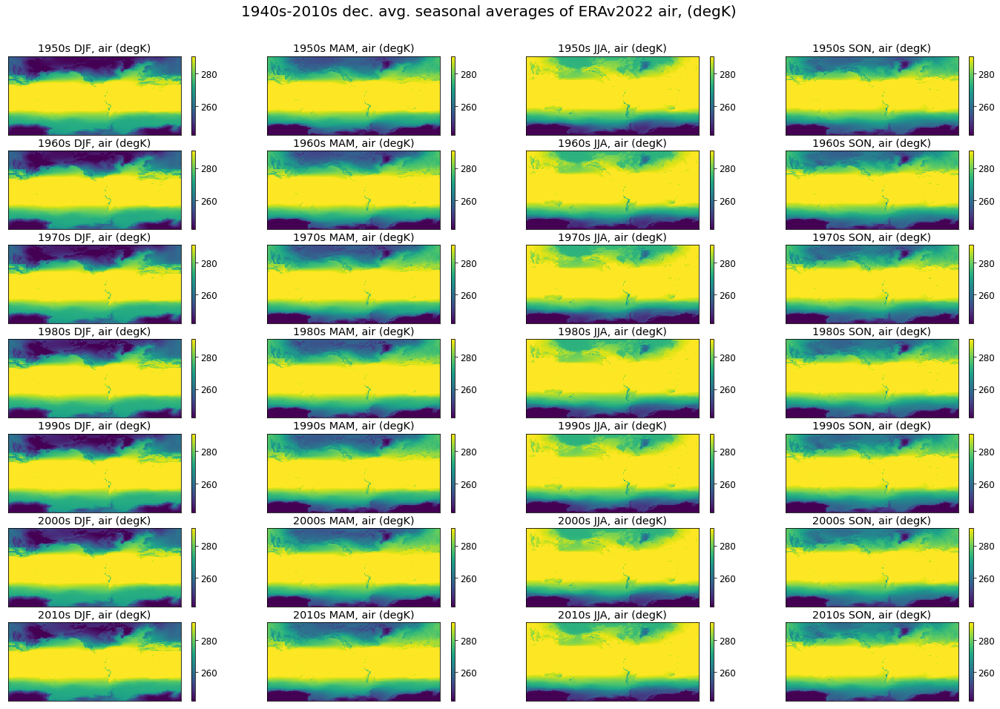

In [46]:
tnc = eold_bulk_8
tvar = 'air'
erav = 'ERAv2022'
make_seasonal_ERA_plot(tnc, tvar, erav)

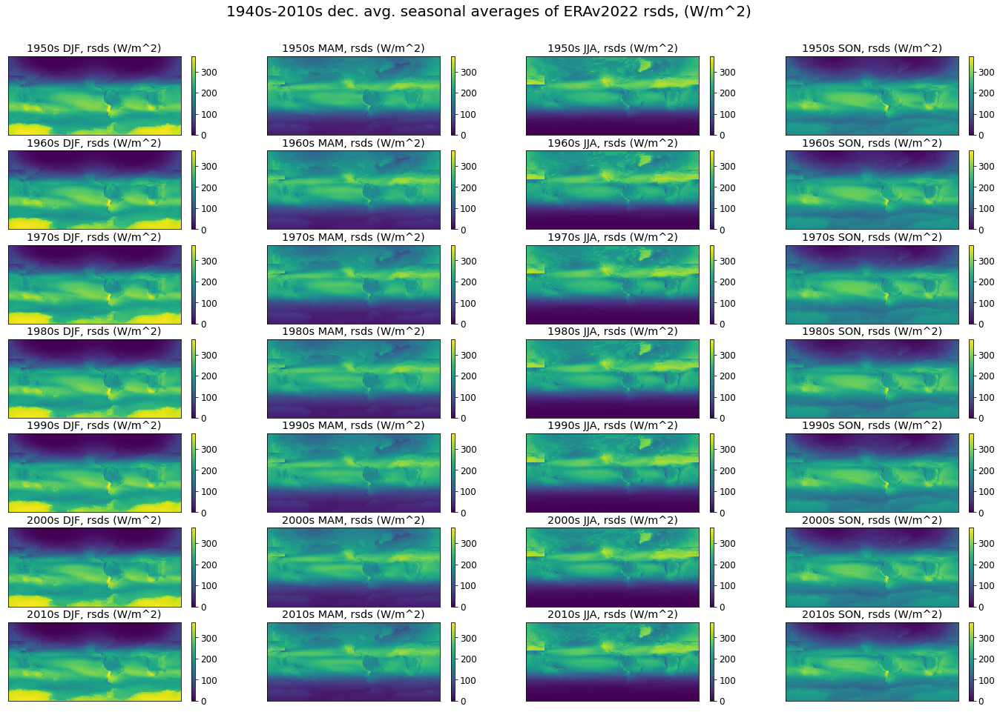

In [47]:
tnc = eold_bulk_11
eold_bulk_11
tvar = 'rsds'
erav = 'ERAv2022'
make_seasonal_ERA_plot(tnc, tvar, erav)

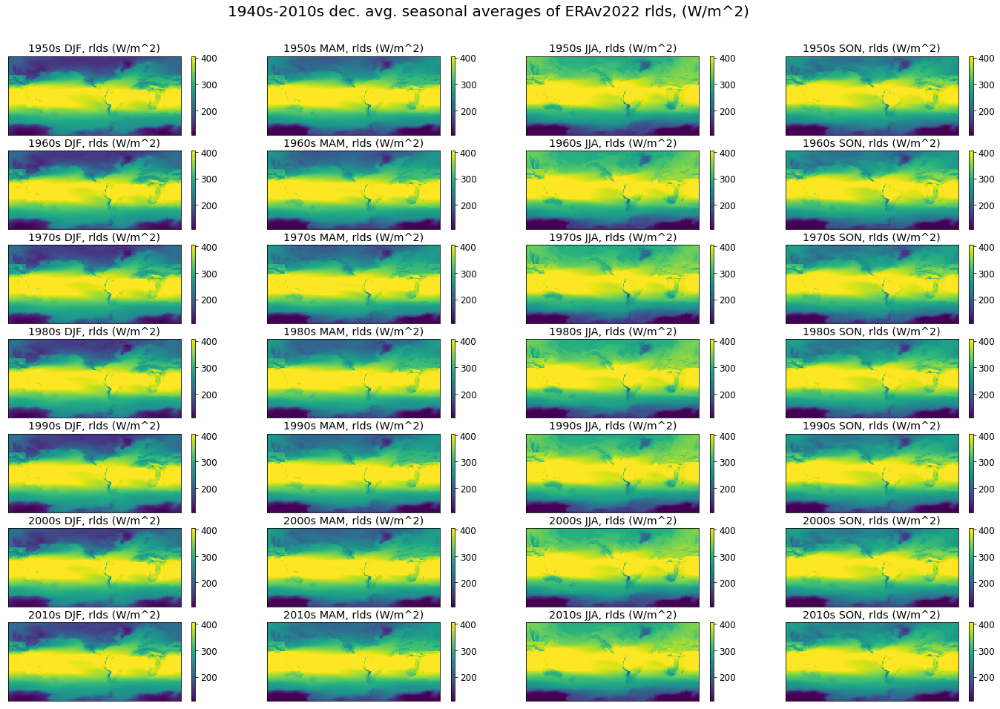

In [48]:
tnc = eold_bulk_12
tvar = 'rlds'
erav = 'ERAv2022'
make_seasonal_ERA_plot(tnc, tvar, erav)

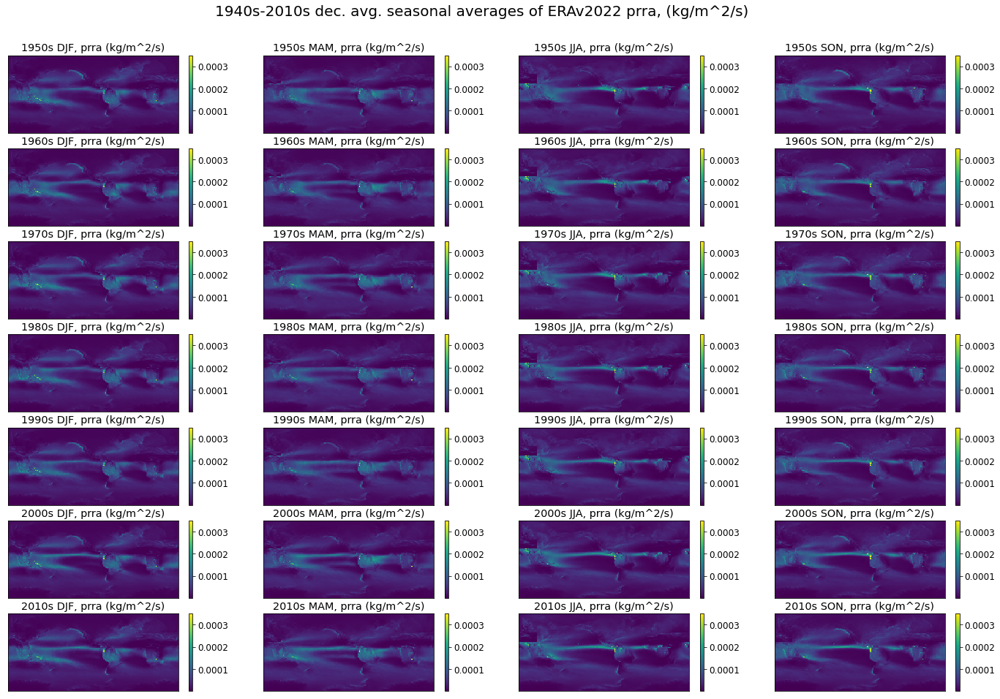

In [49]:
tnc = eold_bulk_13
tvar = 'prra'
erav = 'ERAv2022'
make_seasonal_ERA_plot(tnc, tvar, erav)

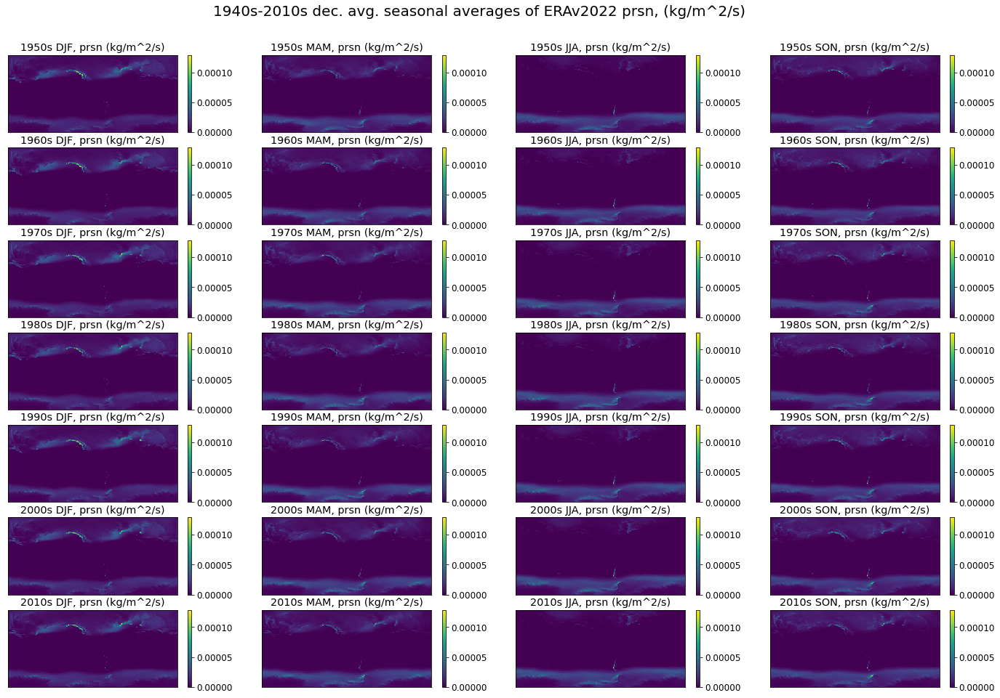

In [50]:
tnc = eold_bulk_14
tvar = 'prsn'
erav = 'ERAv2022'
make_seasonal_ERA_plot(tnc, tvar, erav)

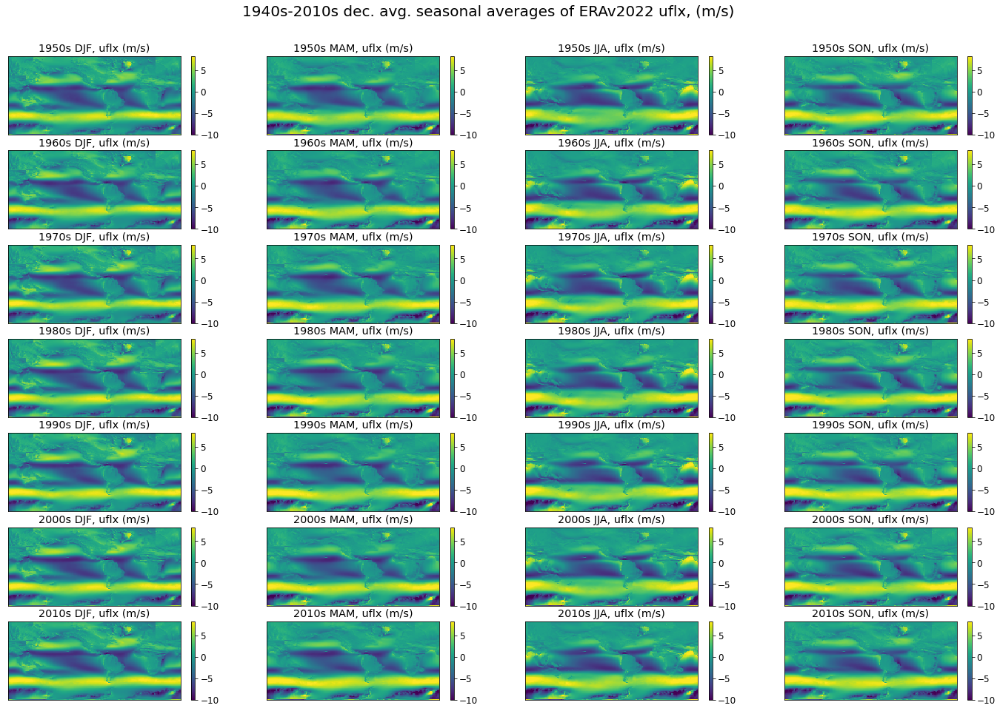

In [51]:
tnc = eold_taux
tvar = 'uflx'
erav = 'ERAv2022'
make_seasonal_ERA_plot(tnc, tvar, erav)

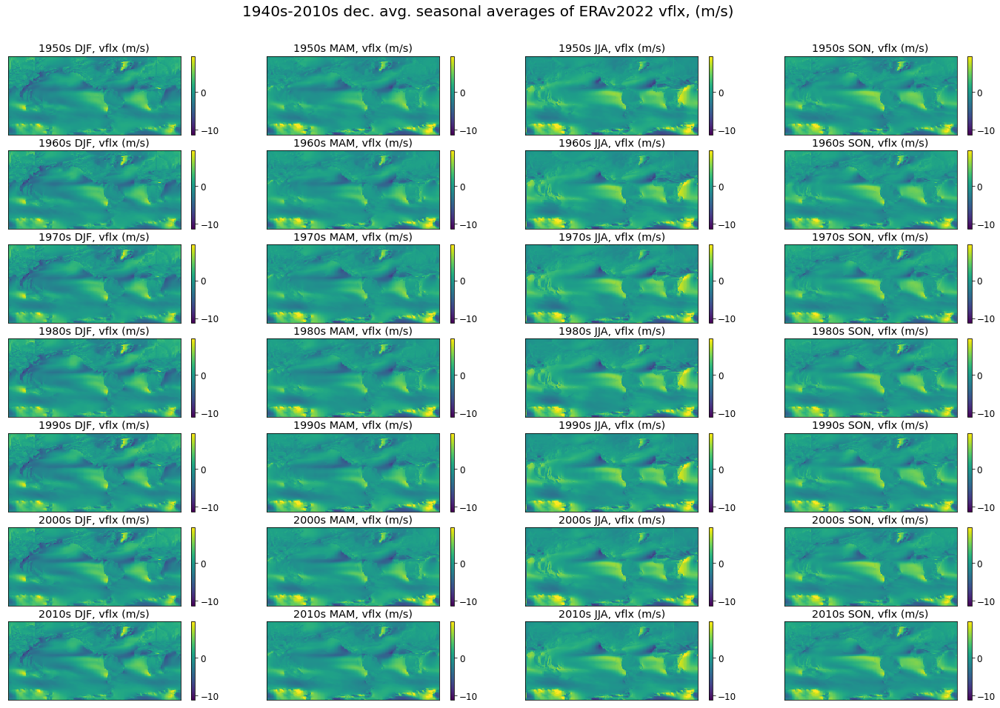

In [52]:
tnc = eold_tauy
tvar = 'vflx'
erav = 'ERAv2022'
make_seasonal_ERA_plot(tnc, tvar, erav)

### difference plots

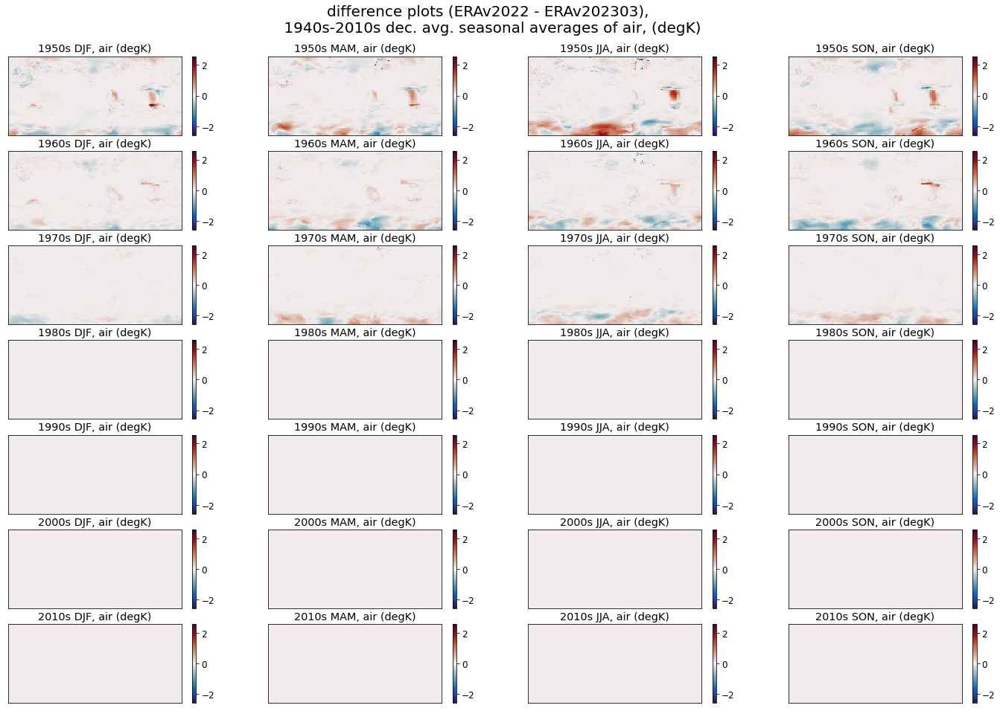

In [53]:
tnco = eold_bulk_8
tncn = enew_bulk_8
tvar = 'air'
make_seasonal_ERA_plot_diff(tnco, tncn, tvar)

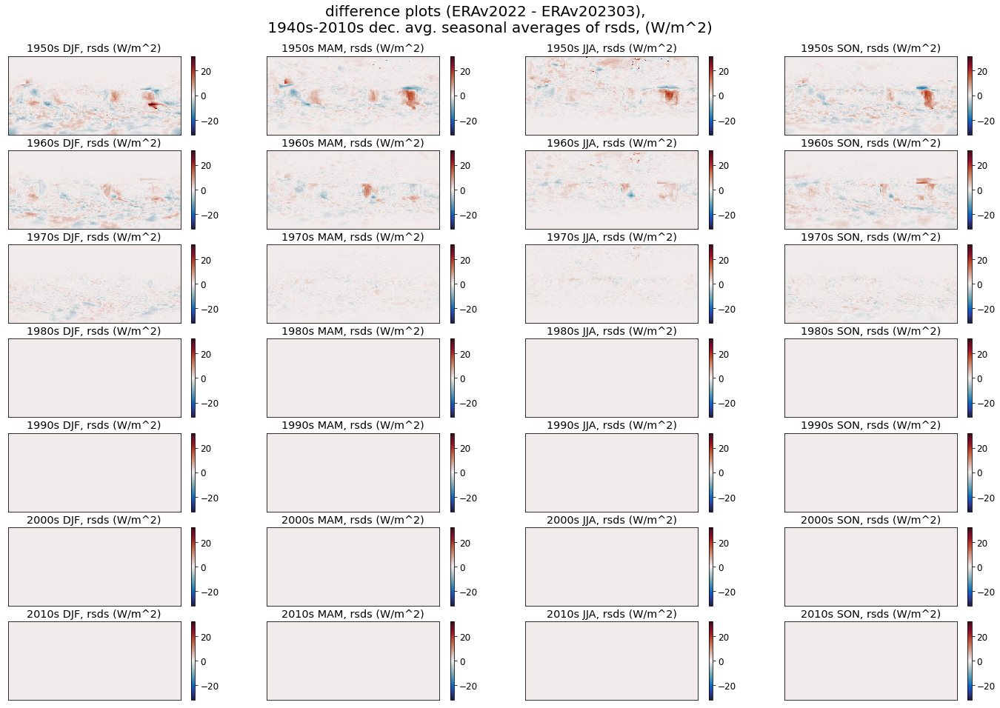

In [54]:
tnco = eold_bulk_11
tncn = enew_bulk_11
tvar = 'rsds'
make_seasonal_ERA_plot_diff(tnco, tncn, tvar)

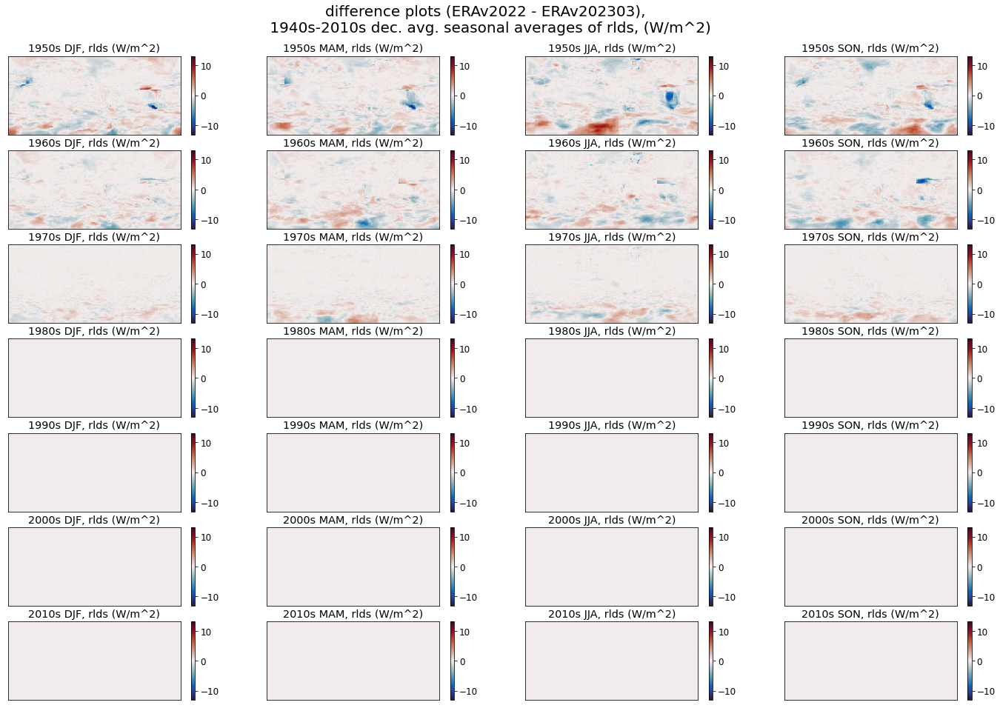

In [56]:
tnco = eold_bulk_12
tncn = enew_bulk_12
tvar = 'rlds'
make_seasonal_ERA_plot_diff(tnco, tncn, tvar)

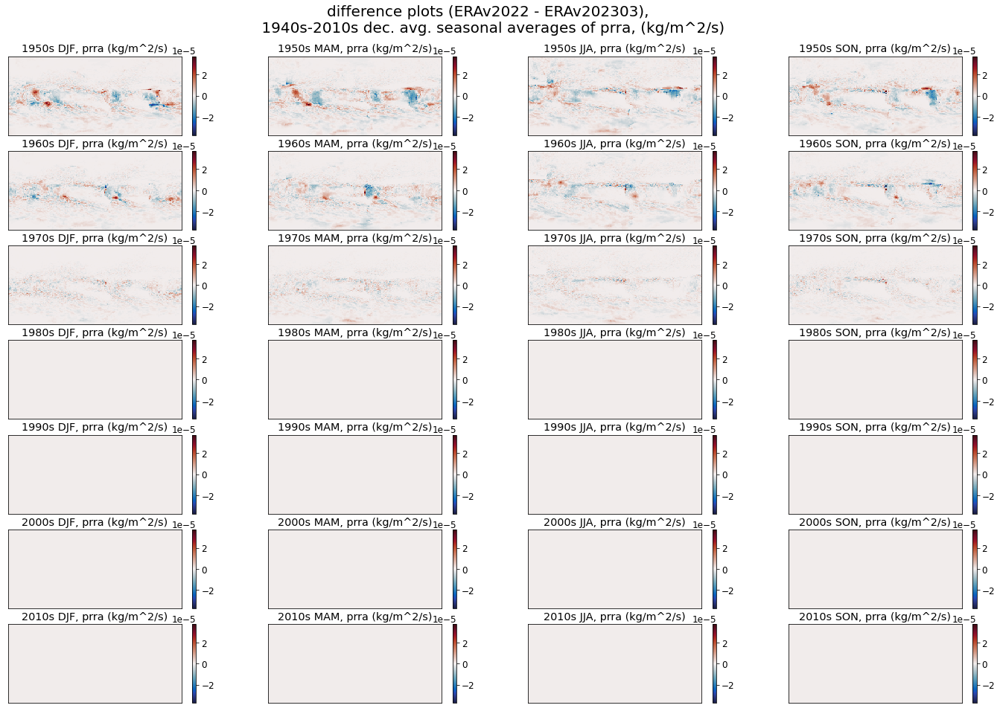

In [57]:
tnco = eold_bulk_13
tncn = enew_bulk_13
tvar = 'prra'
make_seasonal_ERA_plot_diff(tnco, tncn, tvar)

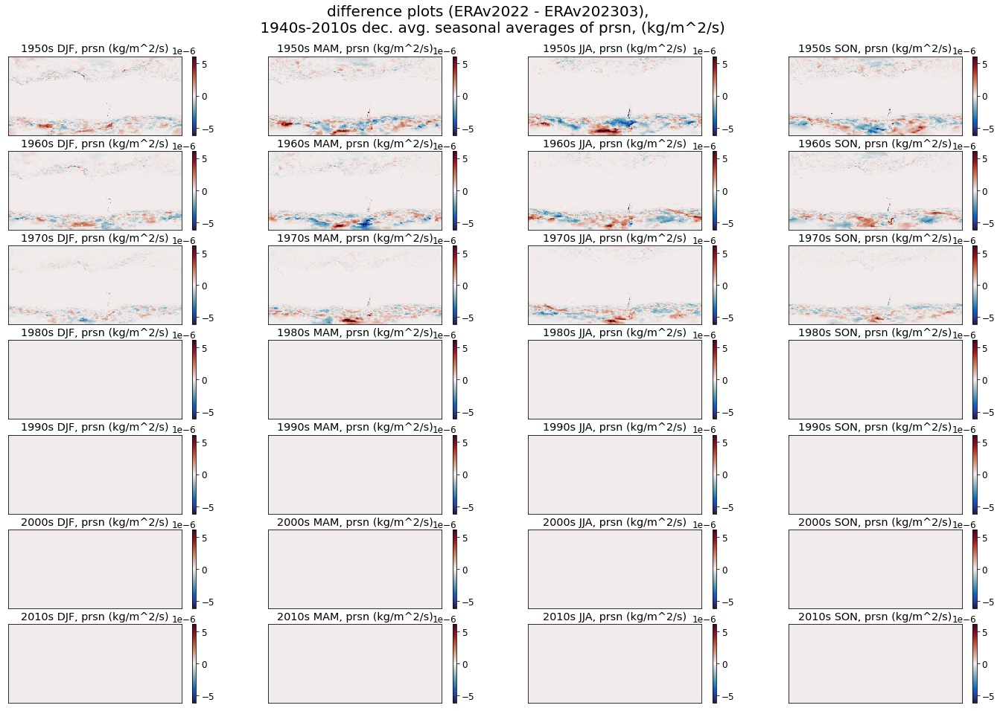

In [59]:
tnco = eold_bulk_14
tncn = enew_bulk_14
tvar = 'prsn'
make_seasonal_ERA_plot_diff(tnco, tncn, tvar)

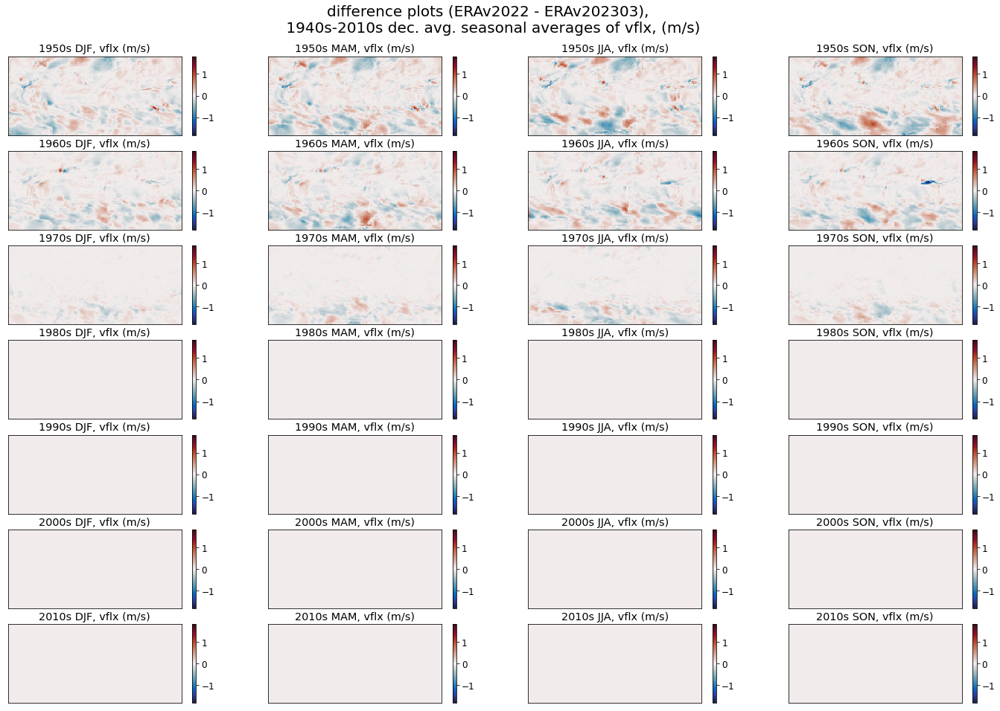

In [60]:
tnco = eold_tauy
tncn = enew_tauy
tvar = 'vflx'
make_seasonal_ERA_plot_diff(tnco, tncn, tvar)

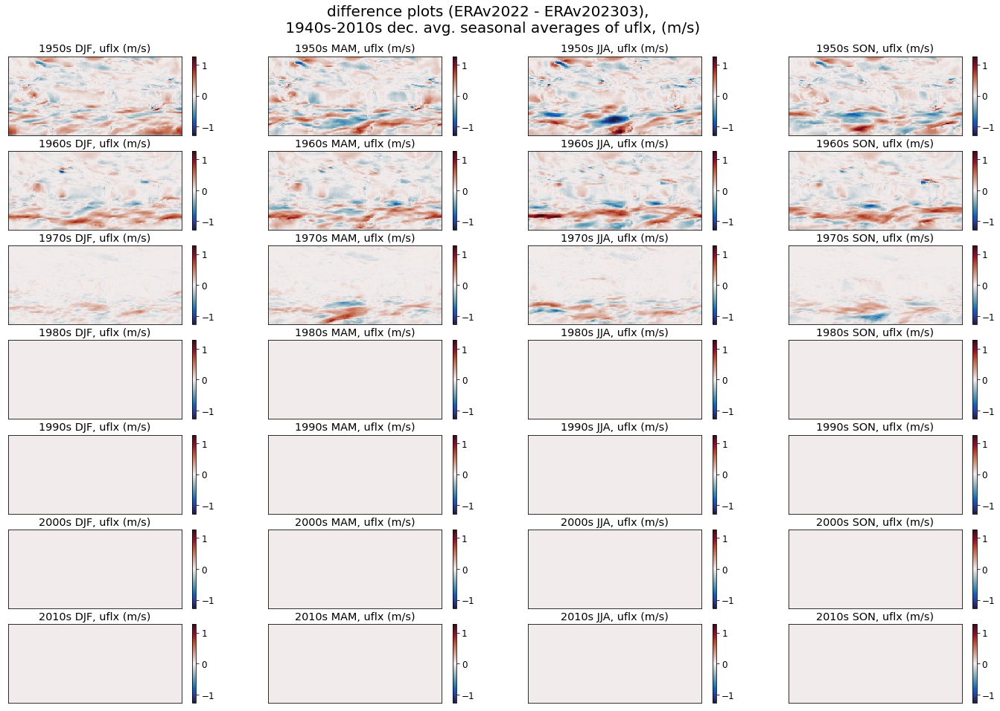

In [61]:
tnco = eold_taux
tncn = enew_taux
tvar = 'uflx'
make_seasonal_ERA_plot_diff(tnco, tncn, tvar)